# License

In [4]:
# Copyright 2021 University of San Andres' Authors.

In [6]:
#@title MIT License
#
# Copyright (c) 2022 University of San Andres
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# Diseña tu propia red neuronal: clasificación de flores

![Tulip Field](https://hips.hearstapps.com/hbu.h-cdn.co/assets/17/09/1488567815-index-european-tulips.jpg)

El objetivo de este práctico es definir nuestra propia red neuronal, es decir, la arquitectura que ésta debe tener de tal modo de conseguir una clasificación de flores lo más robusta posible.

Los puntos a atacar son los siguientes:

* Descargar el set de datos de imágenes de flores (3700 fotos).
* Visualizar las imágenes y los distintos tipos de flores (labels).
* Separar el set de datos en 3 subconjuntos de datos: `train`, `val`, `test`.
* Preprocesar los datos, una parte muy importante en algoritmos que aprenden.
* Definir arquitectura de la red neuronal.
* Ajustar hiperparámetros, por ejemplo, *learning rate*, *epochs*, etc.
* Entrenar y verificar cuán bien entrenamos.
* Aumento de datos para un mejor entrenamiento.
* Verificación final de los resultados.



## Primero los datos

Ningún problema de Machine Learning (ML) puede ser atacado sin los datos, es por eso que en esta ocasión bajaremos imágenes de muchos tipos de flores de un set de datos públicos. Para esto utilizaremos *Python*, el lenguaje de programación más usado en aplicaciones de ML.

La siguiente celda importará código disponible por desarrolladores y científicos en el mundo para que podamos descargar los datos.

In [7]:
%load_ext tensorboard

import PIL
import pathlib
import numpy as np
import tensorflow as tf

print(tf.__version__)

2.8.0


In [8]:
gpu_devices = tf.config.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)

print('Num GPU available:', len(gpu_devices))

Num GPU available: 1


Luego, procedemos a descargar los datos del sitio: https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz

Con tan sólo ejecutar la siguiente celda, Python comenzará a descargar los datos por nosotros.

In [9]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

228827136/228813984 [==============================] - 2s 0us/step


Un paso importante es saber cuántas imágenes tenemos disponibles para poder trabajar. Ejecutando siguiente celda de código nos dirá exactamente cuantas fotos tenemos.

In [10]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


### Visualización de los datos

Lo primero que vamos a hacer antes de comenzar a trabajar, es visualizar las fotos que tenemos. La siguientes celdas nos mostrarán una foto de cada tipo de flor que tenemos en el set de datos.

Las clases de flores son:
* Rosas (*Roses*).
* Tulipanes (*Tulips*).
* Margaritas (*Daisies*).
* Diente de León (*Dandelion*).
* Girasol (*Sunflower*).



In [11]:
rose = str(list(data_dir.glob('roses/*'))[0])
tulip = str(list(data_dir.glob('tulips/*'))[0])
daisy = str(list(data_dir.glob('daisy/*'))[0])
dandelion = str(list(data_dir.glob('dandelion/*'))[0])
sunflower = str(list(data_dir.glob('sunflowers/*'))[0])

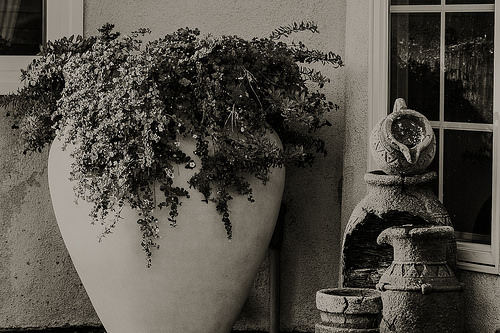

In [12]:
PIL.Image.open(rose)

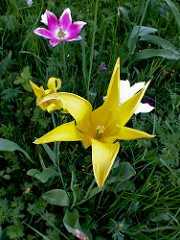

In [13]:
PIL.Image.open(tulip)

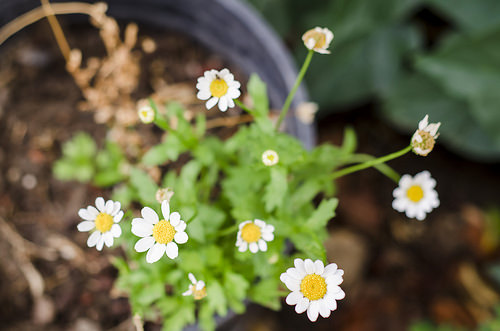

In [14]:
PIL.Image.open(daisy)

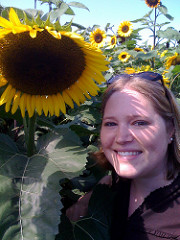

In [15]:
PIL.Image.open(sunflower)

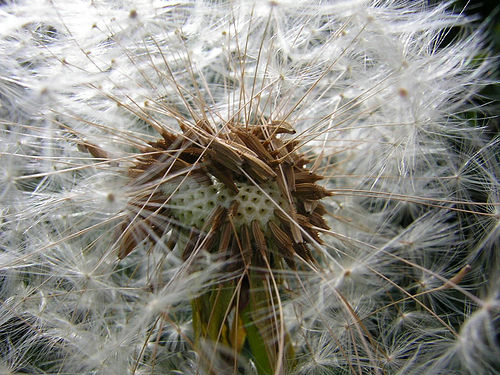

In [16]:
PIL.Image.open(dandelion)

## Separando los datos

Tensorflow es una de las herramientas que nos ayudará con el todo el trabajo pesado de separación de datos en 3 distintos de subconjuntos: entrenamiento, validación, y prueba. En inglés, los llamaremos *training*, *validation*, y *testing*. También más adelante nos ayudará con la parte de entrenamiento.

Antes de separar los datos debemos definir cuáles son los siguientes parámetros: `batch_size`, `img_height`, `img_width`.



In [17]:
batch_size = 32
img_height = 180
img_width = 180

### Set de entrenamiento

La siguiente celda se encarga de generar, a partir del set de datos completo, el set de datos de entrenamiento.

In [18]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


### Set de validación

Esta celda, genera el set de datos de validación.

In [19]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


### Clases de flores

Tal y como anunciamos anteriormente, Tensorflow conoce las clases que hay en el set de datos. Para ello ejecutamos el código de la siguiente celda.

**IMPORTANTE**: notar que la persona que armó el set de datos en Tensorflow ya había definido la clases en el set de datos, de tal manera que sea posible el entrenamiento con los algoritmos de ML.

In [20]:
class_names = train_ds.class_names
print(class_names)

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


También podemos visualizar nuevamente las imágenes con sus respectivas etiquetas utilizando otra herramiento llamada `matplotlib`. Ejecutamos la siguiente celda para ver las fotos de una manera distinta a la anterior, pero esta vez sólo del set de datos de entrenamiento.

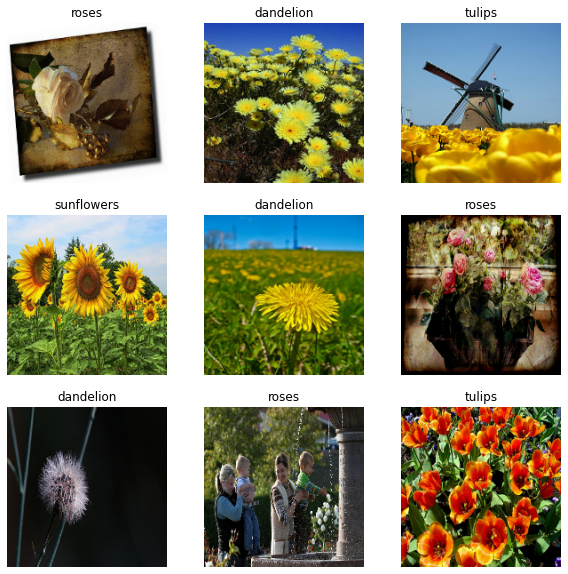

In [21]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

## Preprocesando los datos

Para ingresar los datos a la red neuronal es necesario aplicar un tipo de procesamiento previo. Antes, al cargar los set de datos de entrenamien y validación, ya aplicamos algunas transformaciones a los datos. En primer lugar, elegimos qué tamaño tengan las imágenes; porque no todas las imágenes originales tienen las mismas dimensiones. En segundo lugar, exigimos que los datos vengan de a grupos de 32. Dicho en palabras, nuestros datos vendrán en grupos de 32, donde cada canal de la imagen tendrá un ancho por alto de 180 pixels por 180 pixels. Cada canal corresponde al canal rojo, azul y verde de una foto a color.

Al ejecutar la siguiente celda vamos a ver del primer grupo de imágenes para ingresar a la red neuronal.

In [22]:
for image_batch, labels_batch in train_ds:
  print(f"Image batch size: {image_batch.shape}")
  print(f"Label batch size: {labels_batch.shape}")
  break

Image batch size: (32, 180, 180, 3)
Label batch size: (32,)


### Normalización

Lo próximo que tenemos que hacer es normalizar las imágenes antes de ingresar a la red neuronal. Normalizar es el proceso por el cual los valores de los pixeles de una imagen van a ir entre valores del 0 al 1.

Para demostrar esto, visualizaremos los siguiente. Primero, vamos a mostrar los valores de los pixels de una imagen. Y luego, vamos a ver que el máximo valor de la imagen normalizada es 1 y el mínimo es 0; en el medio pueden haber valores entre el 0 y el 1.

In [23]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

En este primer caso, visualizamos los valores de cada pixel y vemos que no corresponden entre 0 y 1.

In [24]:
image_batch, labels_batch = next(iter(train_ds))
image_batch[0]

<tf.Tensor: shape=(180, 180, 3), dtype=float32, numpy=
array([[[147.77777 ,  98.77778 ,  68.77778 ],
        [151.33333 , 102.333336,  72.333336],
        [153.94444 , 104.94444 ,  74.94444 ],
        ...,
        [100.94443 ,  59.944427,  38.055573],
        [ 99.24536 ,  58.24536 ,  39.75464 ],
        [ 99.      ,  58.      ,  40.      ]],

       [[147.77777 ,  98.77778 ,  68.77778 ],
        [151.33333 , 102.333336,  72.333336],
        [154.21204 , 105.212036,  75.212036],
        ...,
        [101.22776 ,  60.22776 ,  38.338905],
        [100.04722 ,  59.04722 ,  39.04722 ],
        [ 99.      ,  58.      ,  39.779633]],

       [[147.77777 ,  98.77778 ,  68.77778 ],
        [151.72685 , 102.72685 ,  72.72685 ],
        [154.88889 , 105.888885,  75.888885],
        ...,
        [101.94443 ,  60.944427,  39.003086],
        [100.16666 ,  59.166656,  39.00926 ],
        [ 99.18364 ,  58.18364 ,  38.828705]],

       ...,

       [[253.52779 , 246.52779 , 236.52779 ],
        [253.

Aplicamos la normalización a esta misma imagen, y volvemos a mostrar los valores de los pixels.

In [25]:
normalization_layer = tf.keras.layers.Rescaling(1./255)
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
image_batch[0]


<tf.Tensor: shape=(180, 180, 3), dtype=float32, numpy=
array([[[0.51361656, 0.28224403, 0.01539579],
        [0.52287585, 0.2929194 , 0.01535948],
        [0.54161227, 0.31316268, 0.02775962],
        ...,
        [0.7287945 , 0.6616922 , 0.5658316 ],
        [0.7354576 , 0.6526143 , 0.56813735],
        [0.7311004 , 0.6508716 , 0.56214607]],

       [[0.54264706, 0.3151961 , 0.02892157],
        [0.5372549 , 0.3114379 , 0.01633987],
        [0.54814816, 0.32461876, 0.0204793 ],
        ...,
        [0.7405229 , 0.6761438 , 0.5789216 ],
        [0.7383988 , 0.6669937 , 0.5848038 ],
        [0.7318628 , 0.65882355, 0.58480394]],

       [[0.5345498 , 0.30709878, 0.02082426],
        [0.55141616, 0.325817  , 0.03006536],
        [0.55374   , 0.33021063, 0.02578068],
        ...,
        [0.7424111 , 0.679666  , 0.5816268 ],
        [0.7372549 , 0.6741286 , 0.58229864],
        [0.73289776, 0.66900885, 0.5739108 ]],

       ...,

       [[0.62291217, 0.454775  , 0.12650698],
        [0.62

Y ahora verificamos que el máximo de la imagen sea 1 y el mínimo 0.

In [27]:
# Notice the pixel values are now in `[0,1]`.
print(f"Mínimo: {np.min(image_batch[0])}", f"Máximo: {np.max(image_batch[0])}")

Mínimo: 0.0 Máximo: 1.0


## Diseñando la red neuronal

A partir de ahora estamos listos para definir y crear la red neuronal, es decir, explicitar la arquitectura que va a tener nuestra red.

Para ello tenemos la opción de agregar tipos de capas. Recordar que no son todas obligatorias y no hay límite de cuántas agregar (en principio).

Tipos de capas:
* `tf.keras.layers.Conv2D(filters, kernel_size, padding='same', activation=None)`
* `tf.keras.layers.MaxPooling2D()`
* `tf.keras.layers.Flatten()`
* `tf.keras.layers.Dropout(rate)`
* `tf.keras.layers.Dense(units, activation=None)`

La idea es que ustedes investiguen y jueguen de tal manera de que se pueda armar una red capaz de poder entrenarse. Es importante empezar de a pasos chiquitos e ir creciendo la red hasta que mejore.


In [62]:
num_classes = len(class_names)

model = tf.keras.models.Sequential([
  tf.keras.layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

Una vez definido la arquitectura, debemos elegir algunos parámetros más. En este caso no es necesario modificar nada, les damos los parámetros de compilación.

In [64]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

Con la siguiente celda podemos ver el resúmen de la red neuronal. Finalmente, nos va a decir cuántos parámetros van a ser necesario entrenar con la red que definimos. Tengan cuidado que pueden ser MUCHOS!

In [65]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 45, 45, 64)       

### Tensorboard

Tensorboard nos hará el trabajo más divertido, ya que nos permitirá tener una visualización del trabajo que está realizando la red neuronal, y también, nos dirá cómo le está yendo en términos de desempeño. Ejecutamos la próxima celda para inicializar Tensorboard.

In [66]:
import os
import datetime

basedir = '/tmp/flowers/'
logdir = os.path.join(basedir, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
os.makedirs(logdir, exist_ok=True)

%tensorboard --reload_multifile True --logdir {basedir}

Output hidden; open in https://colab.research.google.com to view.

## Entrenamiento

Ahora vamos a comenzar a entrenar el algoritmo. Recuerden elegir la cantidad de epochs que deseen entrenar.

In [67]:
epochs=10

tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=10,
  callbacks=[tensorboard_callback],
)

Epoch 1/10
92/92 [==============================] - 6s 59ms/step - loss: 1.4330 - accuracy: 0.3883 - val_loss: 1.1438 - val_accuracy: 0.5041
Epoch 2/10
92/92 [==============================] - 5s 57ms/step - loss: 0.9709 - accuracy: 0.6376 - val_loss: 0.9855 - val_accuracy: 0.6117
Epoch 3/10
92/92 [==============================] - 6s 65ms/step - loss: 0.7609 - accuracy: 0.7129 - val_loss: 0.9013 - val_accuracy: 0.6567
Epoch 4/10
92/92 [==============================] - 6s 63ms/step - loss: 0.5597 - accuracy: 0.7926 - val_loss: 0.9879 - val_accuracy: 0.6349
Epoch 5/10
92/92 [==============================] - 5s 54ms/step - loss: 0.3790 - accuracy: 0.8655 - val_loss: 1.0808 - val_accuracy: 0.6417
Epoch 6/10
92/92 [==============================] - 5s 54ms/step - loss: 0.2428 - accuracy: 0.9203 - val_loss: 1.3495 - val_accuracy: 0.6253
Epoch 7/10
92/92 [==============================] - 5s 54ms/step - loss: 0.1288 - accuracy: 0.9639 - val_loss: 1.4769 - val_accuracy: 0.6158
Epoch 8/10
92

### Testing

In [73]:
def test(flower_url, filename):
  path = tf.keras.utils.get_file(filename, origin=flower_url)

  img = tf.keras.utils.load_img(
      path, target_size=(img_height, img_width)
  )
  img_array = tf.keras.utils.img_to_array(img)
  img_array = tf.expand_dims(img_array, 0) # Create a batch

  predictions = model.predict(img_array)
  score = tf.nn.softmax(predictions[0])

  print(
      "This image most likely belongs to {} with a {:.2f} percent confidence."
      .format(class_names[np.argmax(score)], 100 * np.max(score))
  )

In [74]:
test("https://storage.googleapis.com/ds-workshop/flowers/test/roses/3278995478.jpg", "3278995478")

147456/132608 [=================================] - 0s 0us/step
This image most likely belongs to roses with a 97.35 percent confidence.


¡Felicitaciones! Entrenaste la red neuronal, pero tengo que mostrate algo, un problema muy común en machine learning.


## Overfitting

El *overfitting* es un problema extremadamente común en los algoritmos de aprendizaje y también es muy intuitivo de cómo aprenden los sistemas en general. Para revisar que nuestra red neuronal comenzó a sufrir de este problema, es necesario graficar la *accuracy* de entrenamiento y la *accuracy* de validación. Ejecutemos la siguiente celda y veamos...

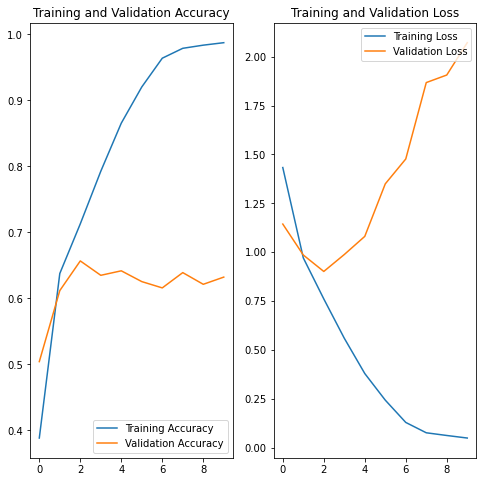

In [75]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Lo que estamos viendo es que la accuracy de entrenamiento es muchísimo más alta que la accuracy de validación. Recuerden que la red neuronal se entrena con los datos de entrenamiento, y los datos de validación se utilizan durante el entrenamiento para verificar cómo le está yendo.

Vemos que la red neuronal aprendió "de memoria" los datos de entrenamiento, y cuando le mostramos datos que nunca antes había visto, no supo clasificar bien los datos. Este es el problema de overfitting.

## Data Augmentation

*Data augmentation* es una técnica por la cual podemos ayudar a solucionar el overfitting. La idea es aplicar transformaciones, que tengan sentido, a los datos para generar nuevos datos. Por ejemplo, el caso más común es el de espejar una imagen que puede ayudar a los algortimos a aprender mejor. Nosotros, los humanos, sabemos que una foto de un gato espejada, sigue teniendo un gato y podemos encima decir qué gato es. Entonces, ¿por qué una red neuronal no podría hacer lo mismo?

Veamos cómo Tensorflow nos ayuda a aumentar los datos.

### Transformaciones

Las transformaciones que aplicaremos son:

* Espejar horizontalmente la imagen.
* Rotar de forma aleatoria un factor del número `π`.
* Un zoom aleatorio de un factor dado.

In [76]:
data_augmentation = tf.keras.models.Sequential(
  [
    tf.keras.layers.RandomFlip("horizontal", input_shape=(img_height, img_width, 3)),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
  ]
)

Ahora visualizamos cómo se ve una misma imagen con distintas transformaciones.

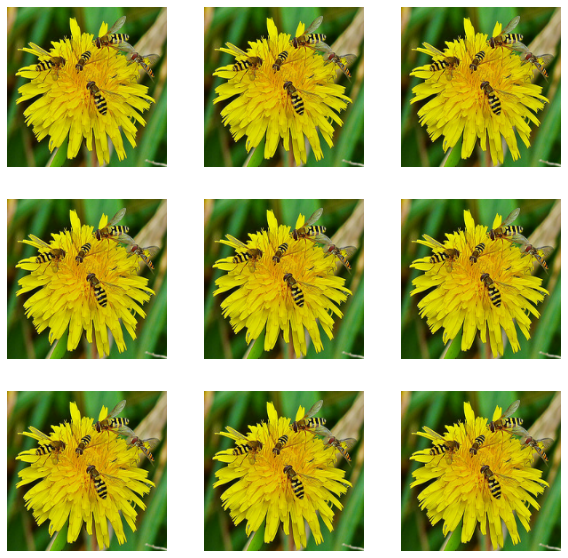

In [77]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

Ya que sabemos que cómo se ven las transformaciones, vamos a sumarselas al modelo para que pueda se entrenado con ese tipo de datos.

In [78]:
model = tf.keras.models.Sequential([
  data_augmentation,
  tf.keras.layers.Rescaling(1./255),
  tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

In [79]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [80]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_6 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_5 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                 

Elegimos nuevamente la cantidad de epochs que queremos entrenar...y esperamos.

In [81]:
epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
92/92 [==============================] - 6s 55ms/step - loss: 1.3466 - accuracy: 0.4063 - val_loss: 1.1345 - val_accuracy: 0.5531
Epoch 2/15
92/92 [==============================] - 5s 54ms/step - loss: 1.0474 - accuracy: 0.5800 - val_loss: 1.0453 - val_accuracy: 0.5831
Epoch 3/15
92/92 [==============================] - 5s 52ms/step - loss: 0.9610 - accuracy: 0.6168 - val_loss: 0.9140 - val_accuracy: 0.6390
Epoch 4/15
92/92 [==============================] - 5s 52ms/step - loss: 0.8865 - accuracy: 0.6638 - val_loss: 0.8610 - val_accuracy: 0.6676
Epoch 5/15
92/92 [==============================] - 5s 53ms/step - loss: 0.8322 - accuracy: 0.6744 - val_loss: 0.8042 - val_accuracy: 0.6798
Epoch 6/15
92/92 [==============================] - 5s 52ms/step - loss: 0.7783 - accuracy: 0.7020 - val_loss: 0.7840 - val_accuracy: 0.6907
Epoch 7/15
92/92 [==============================] - 5s 53ms/step - loss: 0.7195 - accuracy: 0.7207 - val_loss: 0.8334 - val_accuracy: 0.6771
Epoch 8/15
92

Ejecutamos la celda, y vemos cómo se entreno. O también podemos ir a Tensorboard más arriba a visualizar la accuracy y la loss function.

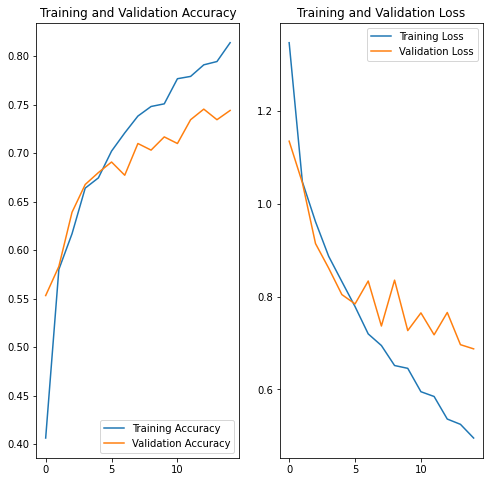

In [82]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

¡Hubo una gran mejora en cuanto al overfitting! Ya la accuracies están más cercanas durante todo el entrenamiento.

Ahora probemos si clasifica bien.

In [85]:
test("https://storage.googleapis.com/ds-workshop/flowers/test/tulips/2208869753.jpg", "2208869753")

This image most likely belongs to tulips with a 95.99 percent confidence.
